In [1]:
import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from astropy.io import fits
from astropy.wcs import WCS

In [2]:
LINUX_DIRECTORY = "Debian/home/u20482jg/MPHYS_Project_Local"
FIGURE_SAVEDIR = "figures/comap_maps"

In [3]:
maps_dir = f"{LINUX_DIRECTORY}/data/comap_maps"

maps_fnames = {
    "comap_26.5": "comap_160625_band00_band00_feed01-02-03-04-05-06-07-08-09-11-12-13-14-15-16-17-18-19.fits",
    "comap_27.5": "comap_160625_band01_band01_feed01-02-03-04-05-06-07-08-09-11-12-13-14-15-16-17-18-19.fits",
    "comap_28.5": "comap_160625_band02_band02_feed01-02-03-04-05-06-07-08-09-11-12-13-14-15-16-17-18-19.fits",
    "comap_29.5": "comap_160625_band03_band03_feed01-02-03-04-05-06-07-08-09-11-12-13-14-15-16-17-18-19.fits",
    "comap_30.5": "comap_160625_band04_band04_feed01-02-03-04-05-06-07-08-09-11-12-13-14-15-16-17-18-19.fits",
    "comap_31.5": "comap_160625_band05_band05_feed01-02-03-04-05-06-07-08-09-11-12-13-14-15-16-17-18-19.fits",
    "comap_32.5": "comap_160625_band06_band06_feed01-02-03-04-05-06-07-08-09-11-12-13-14-15-16-17-18-19.fits",
    "comap_33.5": "comap_160625_band07_band07_feed01-02-03-04-05-06-07-08-09-11-12-13-14-15-16-17-18-19.fits"
}

comap_titles = {
    "comap_26.5": "COMAP 26.5 GHz",
    "comap_27.5": "COMAP 27.5 GHz",
    "comap_28.5": "COMAP 28.5 GHz",
    "comap_29.5": "COMAP 29.5 GHz",
    "comap_30.5": "COMAP 30.5 GHz",
    "comap_31.5": "COMAP 31.5 GHz",
    "comap_32.5": "COMAP 32.5 GHz",
    "comap_33.5": "COMAP 33.5 GHz"
}

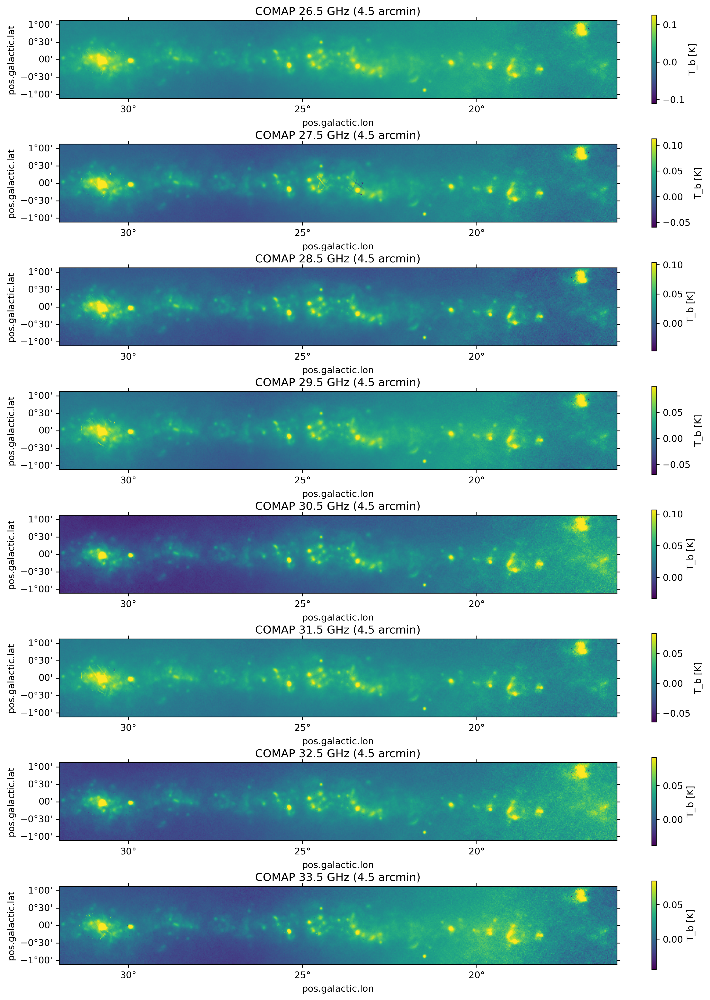

In [4]:
raw_fits = {}
raw_mapdata = {}
headers = {}
WCS_data = {}

for key, fname in maps_fnames.items():
#    path = f"{maps_dir}/{fname}"
    path = f"data/comap_maps/{fname}"
    fits_file = fits.open(path)
    raw_fits[key] = fits_file
    raw_mapdata[key] = fits_file[0].data
    headers[key] = fits_file[0].header
    WCS_data[key] = WCS(headers[key])

mapkeys_list = list(raw_mapdata.keys())

b_max = 1.1
b_min = -1.1
l_max = 32
l_min = 16

fig, axs = plt.subplots(len(mapkeys_list), 1, figsize=(13,2*len(mapkeys_list)),
                        dpi=300, subplot_kw={'projection': WCS_data[mapkeys_list[0]]})

cutouts = {}

for i, map_key in enumerate(mapkeys_list):
    header = headers[map_key].copy()
    raw_data = raw_mapdata[map_key].copy()
    wcs = WCS_data[map_key].copy()

    ref_coords = [header['CRVAL1'], header['CRVAL2']] # [rows, cols]
    ref_pixs = [header['CRPIX1'], header['CRPIX2']] # [rows, cols]
    step_size = float(header['CDELT2'])

    minb_index = int(ref_pixs[1] + (ref_coords[1] - b_max) / step_size)
    maxb_index = int(ref_pixs[1] + (ref_coords[1] - b_min) / step_size)
    minl_index = int(ref_pixs[0] + (ref_coords[0] - l_max) / step_size)
    maxl_index = int(ref_pixs[0] + (ref_coords[0] - l_min) / step_size)

    nrows, ncols = raw_data.shape
    minb_index = max(0, min(nrows - 1, minb_index))
    maxb_index = max(0, min(nrows - 1, maxb_index))
    minl_index = max(0, min(ncols - 1, minl_index))
    maxl_index = max(0, min(ncols - 1, maxl_index))

    cutout = raw_data[minb_index:maxb_index + 1, minl_index:maxl_index + 1].copy()
    cutout[cutout == 0] = np.nan
    cutouts[map_key] = cutout

    wcs.wcs.crpix[1] -= minb_index
    wcs.wcs.crpix[0] -= minl_index

    v_min = np.nanpercentile(cutout, 0.)
    v_max = np.nanpercentile(cutout, 99.5)

    ax = axs[i]
    im = ax.imshow(cutout, origin='lower', cmap='viridis', vmin = v_min,
                    vmax = v_max)
    colours = plt.cm.Greys(np.linspace(0.0, 1.0, 7))
    ax.set_title(f"{comap_titles[map_key]} (4.5 arcmin)")
    ax.set_xlabel = r"l (deg)"
    ax.set_ylabel = r"b (deg)"

    cbar = fig.colorbar(im, orientation='vertical')
    cbar.set_label("T_b [K]")

fig.subplots_adjust(left=0.07, right=0.88, top=0.95, bottom=0.05, hspace=0.4)

plt.savefig(f"{FIGURE_SAVEDIR}/COMAP_4.5acm_cutout_raws.png", dpi=300)
plt.show()


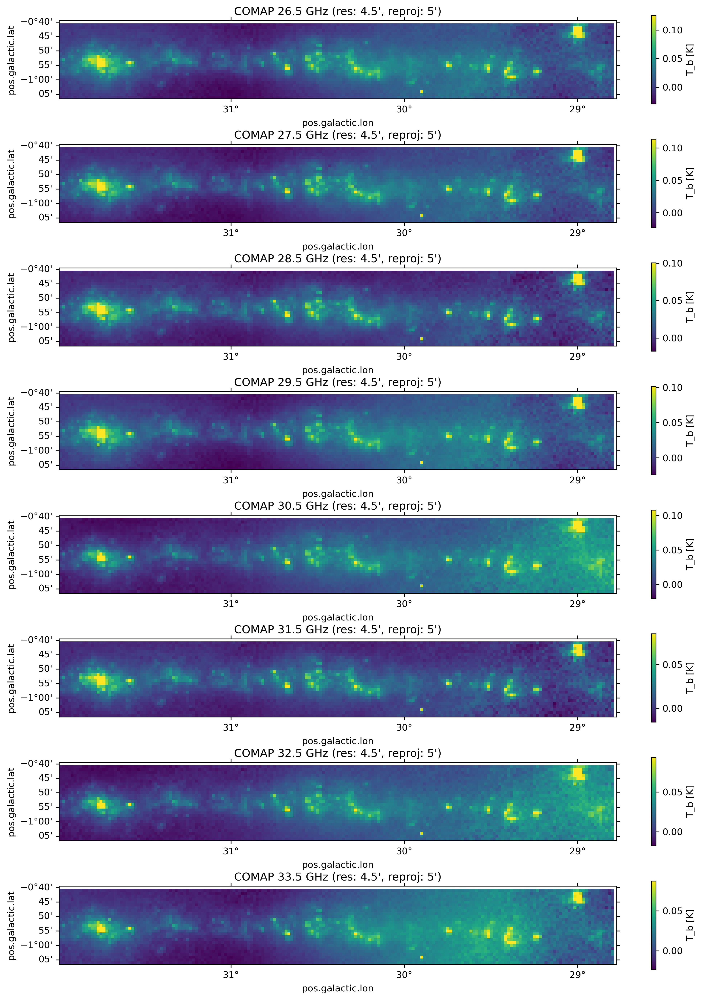

In [5]:
from astropy.wcs.utils import proj_plane_pixel_scales
from reproject import reproject_interp

pix_scale = 5/60

fig, axs = plt.subplots(len(mapkeys_list), 1, figsize=(13,2*len(mapkeys_list)),
                        dpi=300, subplot_kw={'projection': WCS_data[mapkeys_list[0]]})

cutout_reprojs = {}

for i, map_key in enumerate(mapkeys_list):
    cutout = cutouts[map_key]
    old_shape = cutout.shape
    center_pix = np.array(old_shape)/2
    center_l, center_b = wcs.pixel_to_world_values(center_pix[1], center_pix[0])

    raw_scales = proj_plane_pixel_scales(wcs)
    size_x = raw_scales[0] * old_shape[1]
    size_y = raw_scales[1] * old_shape[0]

    new_shape = (
        int(np.ceil(size_y / pix_scale)),
        int(np.ceil(size_x / pix_scale))
    )

    new_wcs = WCS(naxis=2)
    new_wcs.wcs.crval = [center_l, center_b]
    new_wcs.wcs.crpix = [0.5*new_shape[1], 0.5*new_shape[0]]
    new_wcs.wcs.ctype = list(wcs.wcs.ctype)
    new_wcs.wcs.cdelt = np.array([-pix_scale, pix_scale])

    cutout_reproj, ftprint = reproject_interp(
        (cutout, wcs), new_wcs, shape_out=new_shape
    )
    cutout_reprojs[map_key] = cutout_reproj

    v_min = np.nanpercentile(cutout_reproj, 0.)
    v_max = np.nanpercentile(cutout_reproj, 99.5)

    ax = axs[i]
    im = ax.imshow(cutout_reproj, origin='lower', cmap='viridis', vmin = v_min,
                    vmax = v_max)
    colours = plt.cm.Greys(np.linspace(0.0, 1.0, 7))
    ax.set_title(f"{comap_titles[map_key]} (res: 4.5', reproj: 5')")
    ax.set_xlabel = r"l (deg)"
    ax.set_ylabel = r"b (deg)"

    cbar = fig.colorbar(im, orientation='vertical')
    cbar.set_label("T_b [K]")

fig.subplots_adjust(left=0.07, right=0.88, top=0.95, bottom=0.05, hspace=0.4)

plt.savefig(f"{FIGURE_SAVEDIR}/COMAP_4.5acm_cutout_reproj_5acm.png", dpi=300)
plt.show()
    
    


0.758468620019625


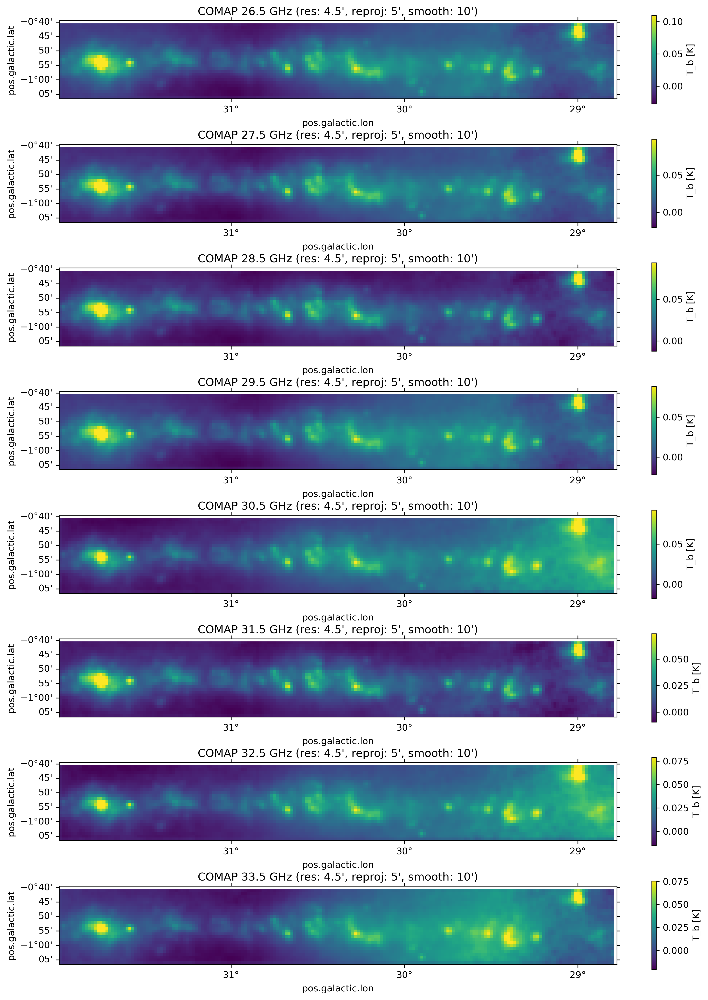

In [6]:
from astropy.convolution import Gaussian2DKernel, convolve

beam_fwhm = 4.5/60
smoothing_fwhm = 10/60

sigma = np.sqrt(smoothing_fwhm**2 - beam_fwhm**2) /\
      (2*np.sqrt(2 * np.log(2)) * pix_scale) # these are in arcmin
print(sigma)
smoothing_kernel = Gaussian2DKernel(x_stddev=sigma)

fig, axs = plt.subplots(len(mapkeys_list), 1, figsize=(13,2*len(mapkeys_list)),
                        dpi=300, subplot_kw={'projection': WCS_data[mapkeys_list[0]]})

for i, map_key in enumerate(mapkeys_list):
      smooth_cutout = convolve(cutout_reprojs[map_key], smoothing_kernel, preserve_nan=True)

      v_min = np.nanpercentile(smooth_cutout, 0.)
      v_max = np.nanpercentile(smooth_cutout, 99.5)

      ax = axs[i]
      im = ax.imshow(smooth_cutout, origin='lower', cmap='viridis', vmin = v_min,
                        vmax = v_max)
      colours = plt.cm.Greys(np.linspace(0.0, 1.0, 7))
      ax.set_title(f"{comap_titles[map_key]} (res: 4.5', reproj: 5', smooth: 10')")
      ax.set_xlabel = r"l (deg)"
      ax.set_ylabel = r"b (deg)"

      cbar = fig.colorbar(im, orientation='vertical')
      cbar.set_label("T_b [K]")

fig.subplots_adjust(left=0.07, right=0.88, top=0.95, bottom=0.05, hspace=0.4)

plt.savefig(f"{FIGURE_SAVEDIR}/COMAP_4.5acm_cutout_smoothed.png", dpi=300)
plt.show()
    